In [ ]:
# biblio data
import sys
sys.path.append("..")
import pandas as pd
import plotly.express as px
from src.fonctions import normalize_columns,naive_forecast_model,seasonal_naive_forecast_model,moving_average_forecast_model,evaluate_forecasts
import plotly.graph_objs as go
import plotly.express as px
import plotly.io as pio
import matplotlib.pyplot as plt

import plotly.graph_objects as go
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pmdarima import auto_arima
import pmdarima as pm


from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller

pio.templates.default = "plotly_white"

In [2]:
data_eco=pd.read_csv('../data/eco2mix-national-cons-def.csv',sep=';')
data_eco.info()

C:\Users\donal\AppData\Local\Temp\ipykernel_24004\3672231568.py:1: DtypeWarning: Columns (23,28) have mixed types. Specify dtype option on import or set low_memory=False.
  data_eco=pd.read_csv('../data/eco2mix-national-cons-def.csv',sep=';')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 455904 entries, 0 to 455903
Data columns (total 37 columns):
 #   Column                                     Non-Null Count   Dtype  
---  ------                                     --------------   -----  
 0   Périmètre                                  455904 non-null  object 
 1   Nature                                     455904 non-null  object 
 2   Date                                       455904 non-null  object 
 3   Heure                                      455904 non-null  object 
 4   Date et Heure                              455904 non-null  object 
 5   Consommation (MW)                          227952 non-null  float64
 6   Prévision J-1 (MW)                         455904 non-null  int64  
 7   Prévision J (MW)                           455904 non-null  int64  
 8   Fioul (MW)                                 227952 non-null  float64
 9   Charbon (MW)                               227952 non-null  float64
 10  Gaz (MW)

In [3]:
data_eco_clean=data_eco.copy()
data_eco_clean.dropna(inplace=True)
data_eco_clean

,Périmètre,Nature,Date,Heure,Date et Heure,Consommation (MW),Prévision J-1 (MW),Prévision J (MW),Fioul (MW),Charbon (MW),...,Gaz - TAC (MW),Gaz - Cogénération (MW),Gaz - CCG (MW),Gaz - Autres (MW),Hydraulique - Fil de l'eau + éclusée (MW),Hydraulique - Lacs (MW),Hydraulique - STEP turbinage (MW),Bioénergies - Déchets (MW),Bioénergies - Biomasse (MW),Bioénergies - Biogaz (MW)
0,France,Données définitives,2022-01-01,02:30,2022-01-01T02:30:00+01:00,51252.0,47200,50200,99.0,13.0,...,86.0,999.0,109.0,1500.0,5787.0,1604.0,396.0,569.0,354.0,334.0
1,France,Données définitives,2022-01-01,05:00,2022-01-01T05:00:00+01:00,45792.0,42800,45100,99.0,13.0,...,89.0,997.0,109.0,1504.0,5645.0,713.0,9.0,562.0,361.0,331.0
2,France,Données définitives,2022-01-01,06:30,2022-01-01T06:30:00+01:00,46561.0,43400,45700,99.0,13.0,...,98.0,994.0,108.0,1503.0,5724.0,798.0,10.0,552.0,350.0,332.0
4,France,Données définitives,2022-01-01,08:30,2022-01-01T08:30:00+01:00,47919.0,43600,47400,99.0,12.0,...,101.0,993.0,110.0,1509.0,5609.0,802.0,10.0,551.0,357.0,330.0
10,France,Données définitives,2022-01-01,18:30,2022-01-01T18:30:00+01:00,53640.0,50600,51800,100.0,13.0,...,103.0,983.0,108.0,1450.0,6362.0,2525.0,2138.0,523.0,348.0,337.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
455896,France,Données consolidées,2024-08-11,03:30,2024-08-11T03:30:00+02:00,33228.0,33400,32900,76.0,20.0,...,1.0,244,218.0,34.0,3495.0,1006.0,147.0,562.0,385.0,329.0
455898,France,Données consolidées,2024-08-11,08:30,2024-08-11T08:30:00+02:00,34588.0,35200,34300,76.0,19.0,...,1.0,243,156.0,33.0,3278.0,1018.0,4.0,562.0,381.0,328.0
455899,France,Données consolidées,2024-08-11,12:30,2024-08-11T12:30:00+02:00,44481.0,43700,43100,74.0,20.0,...,1.0,242,383.0,27.0,2804.0,461.0,4.0,525.0,366.0,325.0
455900,France,Données consolidées,2024-08-11,14:30,2024-08-11T14:30:00+02:00,42849.0,42400,41100,74.0,20.0,...,1.0,241,398.0,26.0,2760.0,475.0,4.0,522.0,352.0,312.0


In [4]:
data_eco_clean=normalize_columns(data_eco_clean)
data_eco_clean['date_et_heure'] = pd.to_datetime(
    data_eco_clean['date_et_heure'], 
    utc=True  # pour unifier le fuseau
)
data_eco_clean.set_index('date_et_heure', inplace=True)
data_eco_clean.sort_index(inplace=True)


In [5]:
#convertir la colonne 'date_heure' en datetime et la définir comme index


data_eco_clean


,perimetre,nature,date,heure,consommation_mw,prevision_j_1_mw,prevision_j_mw,fioul_mw,charbon_mw,gaz_mw,...,gaz_tac_mw,gaz_cogeneration_mw,gaz_ccg_mw,gaz_autres_mw,hydraulique_fil_de_l_eau_eclusee_mw,hydraulique_lacs_mw,hydraulique_step_turbinage_mw,bioenergies_dechets_mw,bioenergies_biomasse_mw,bioenergies_biogaz_mw
date_et_heure,,,,,,,,,,,,,,,,,,,,,
2012-12-31 23:30:00+00:00,France,Données définitives,2013-01-01,00:30,59674.0,59500,58700,473.0,-31.0,3448.0,...,-3.0,2858,499.0,94.0,5555.0,1214.0,758.0,478.0,130.0,161.0
2013-01-01 00:00:00+00:00,France,Données définitives,2013-01-01,01:00,57877.0,57500,56700,472.0,-32.0,3231.0,...,-3.0,2861,279.0,94.0,5582.0,963.0,591.0,475.0,126.0,159.0
2013-01-01 00:30:00+00:00,France,Données définitives,2013-01-01,01:30,57755.0,57800,57400,473.0,-31.0,3240.0,...,-4.0,2866,284.0,94.0,5453.0,735.0,515.0,477.0,125.0,160.0
2013-01-01 01:00:00+00:00,France,Données définitives,2013-01-01,02:00,57243.0,57600,57200,472.0,-31.0,3230.0,...,-3.0,2860,279.0,94.0,5420.0,752.0,212.0,486.0,123.0,159.0
2013-01-01 01:30:00+00:00,France,Données définitives,2013-01-01,02:30,56660.0,56400,55600,472.0,-31.0,3224.0,...,-4.0,2853,281.0,94.0,5261.0,688.0,199.0,479.0,124.0,160.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-31 20:30:00+00:00,France,Données consolidées,2024-12-31,21:30,63574.0,61600,62000,89.0,16.0,1850.0,...,113.0,637.0,353.0,747.0,4571.0,559.0,125.0,542.0,372.0,342.0
2024-12-31 21:00:00+00:00,France,Données consolidées,2024-12-31,22:00,62706.0,60800,61100,89.0,17.0,1853.0,...,105.0,641,356.0,750.0,4549.0,359.0,78.0,545.0,374.0,341.0
2024-12-31 21:30:00+00:00,France,Données consolidées,2024-12-31,22:30,63882.0,61700,61900,90.0,17.0,2029.0,...,101.0,655,524.0,749.0,4445.0,361.0,123.0,549.0,370.0,340.0


In [6]:
#dropna
data_eco_clean.dropna(inplace=True)
data_eco_clean.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 210353 entries, 2012-12-31 23:30:00+00:00 to 2024-12-31 22:30:00+00:00
Data columns (total 36 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   perimetre                            210353 non-null  object 
 1   nature                               210353 non-null  object 
 2   date                                 210353 non-null  object 
 3   heure                                210353 non-null  object 
 4   consommation_mw                      210353 non-null  float64
 5   prevision_j_1_mw                     210353 non-null  int64  
 6   prevision_j_mw                       210353 non-null  int64  
 7   fioul_mw                             210353 non-null  float64
 8   charbon_mw                           210353 non-null  float64
 9   gaz_mw                               210353 non-null  float64
 10  nucleaire_mw                      

In [7]:
#selection consommation_mw

conso=data_eco_clean[['consommation_mw']]
conso.dropna(inplace=True)
conso

C:\Users\donal\AppData\Local\Temp\ipykernel_24004\1376968108.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  conso.dropna(inplace=True)


,consommation_mw
date_et_heure,
2012-12-31 23:30:00+00:00,59674.0
2013-01-01 00:00:00+00:00,57877.0
2013-01-01 00:30:00+00:00,57755.0
2013-01-01 01:00:00+00:00,57243.0
2013-01-01 01:30:00+00:00,56660.0
...,...
2024-12-31 20:30:00+00:00,63574.0
2024-12-31 21:00:00+00:00,62706.0
2024-12-31 21:30:00+00:00,63882.0


In [8]:
#visualiser la consommation_mw dans le temps plotly
fig = px.line(conso, x=conso.index, y='consommation_mw', title='Consommation électrique en MW au fil du temps')
fig.show()

In [9]:
#resampler la conso en daily

conso_daily = conso.resample('D').mean()
#visualiser la consommation_mw daily plotly
fig = px.line(conso_daily, x=conso_daily.index, y='consommation_mw', title='Consommation électrique quotidienne en MW')
fig.show()

ici l'idee est de simplifier simplifier la visualisation en groupant les donnees je maniere journalieres pour faaire la prediction sur le dernier mois et la compare
moi pour avoir la suptilite de consomation journaliere pour avoir les details de consommation la jours pour predire la consommation meme de certaine heures je la journee je ne vais les resampler mais mon test sera 24x2x30 car on a les donnnees de consommation de chaque 30 min

Par contre essayons de visualiser les limites des models naifs pour mettreen envidence la qualite et l'utilite de l'usage de ARIMA/SARIMA 

In [10]:
# repartition en train test avec une fenetre de 30 jours pour le test
test_size = 30
train = conso_daily[:-test_size]
test = conso_daily[-test_size:]
print(f'Taille du train: {len(train)}')
print(f'Taille du test: {len(test)}')

Taille du train: 4354
Taille du test: 30


In [38]:
# model naif pour la conso daily
naive_forecast = naive_forecast_model(train, test, 'consommation_mw')
# model seasonal naif pour la conso daily
seasonal_naive_forecast = seasonal_naive_forecast_model(train, test, 'consommation_mw')
# model moving average pour la conso daily
moving_average_forecast = moving_average_forecast_model(train, test, 'consommation_mw')
# evaluer les modeles 
mae_naive_forecast, rmse_naive_forecast, mape_naive_forecast = evaluate_forecasts(test['consommation_mw'], naive_forecast)
mae_seasonal_naive_forecast, rmse_seasonal_naive_forecast, mape_seasonal_naive_forecast = evaluate_forecasts(test['consommation_mw'], seasonal_naive_forecast)
mae_moving_average_forecast, rmse_moving_average_forecast, mape_moving_average_forecast = evaluate_forecasts(test['consommation_mw'], moving_average_forecast)
print(f'Naive Forecast - MAE: {mae_naive_forecast}, RMSE: {rmse_naive_forecast}, MAPE: {mape_naive_forecast}')
print(f'Seasonal Naive Forecast - MAE: {mae_seasonal_naive_forecast}, RMSE: {rmse_seasonal_naive_forecast}, MAPE: {mape_seasonal_naive_forecast}')
print(f'Moving Average Forecast - MAE: {mae_moving_average_forecast}, RMSE: {rmse_moving_average_forecast}, MAPE: {mape_moving_average_forecast}')

Naive Forecast - MAE: 7467.339855072467, RMSE: 8354.524507130278, MAPE: 11.686264745552887
Seasonal Naive Forecast - MAE: 10954.788285024157, RMSE: 12796.603583613256, MAPE: 17.3154494970608
Moving Average Forecast - MAE: 9290.669392684611, RMSE: 10840.158323767824, MAPE: 14.658560168171078


In [12]:
#visualiser les resultats
fig = px.line(title='Forecast vs Actuals')
fig.add_scatter(x=test.index, y=test['consommation_mw'], name='Actuals')
fig.add_scatter(x=test.index, y=naive_forecast, name='Naive Forecast')
fig.add_scatter(x=test.index, y=seasonal_naive_forecast,  name='Seasonal Naive Forecast')
fig.add_scatter(x=test.index, y=moving_average_forecast,  name='Moving Average Forecast')
fig.add_scatter(x=train.index, y=train['consommation_mw'], name='Train Data')
fig.show()

### ARIMA/SARIMA

In [13]:
#ADF Test

result = adfuller(conso_daily['consommation_mw'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])
for key, value in result[4].items():
    print('Critical Value (%s): %.3f' % (key, value))
if result[1] <= 0.05:
    print("The time series is stationary.")
else:
    print("The time series is non-stationary.")


ADF Statistic: -4.399595284286796
p-value: 0.0002973225447495915
Critical Value (1%): -3.432
Critical Value (5%): -2.862
Critical Value (10%): -2.567
The time series is stationary.


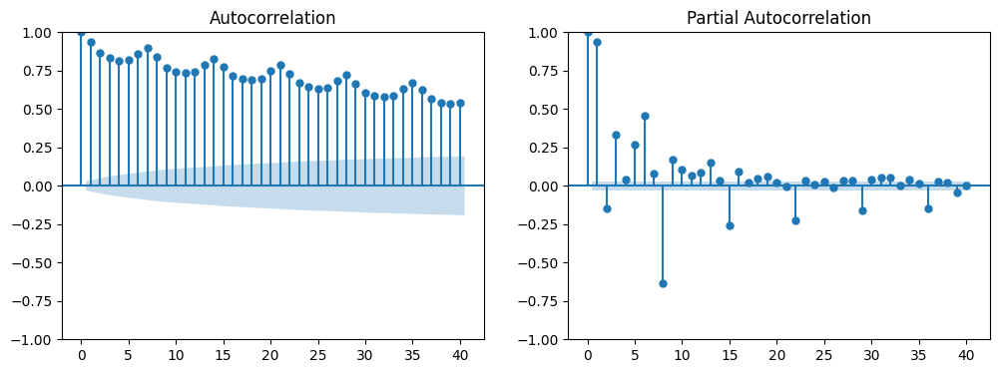

In [14]:

#determine p and q using ACF and PACF plots
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
plot_acf(conso_daily, ax=axes[0], lags=40)
plot_pacf(conso_daily, ax=axes[1], lags=40)
plt.show()


Determinons automatiquement les parametres P Q D sachant que le model est Saisonnier

In [15]:


# Auto-ARIMA avec saisonnalité hebdomadaire
model = auto_arima(
    train,
    start_p=1, start_q=1,
    max_p=7, max_q=7,

    start_P=1, start_Q=1,
    max_P=3, max_Q=3,

    m=7,                     # saisonnalité de 7 jours
    seasonal=True,           # SARIMA
    d=None,                  # auto détection du differencing
    D=None,                  # auto détection du seasonal differencing

    trace=True,
    error_action='ignore',
    suppress_warnings=True,
    stepwise=True
)

print(model.summary())


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(1,0,1)[7] intercept   : AIC=inf, Time=7.75 sec
 ARIMA(0,1,0)(0,0,0)[7] intercept   : AIC=83939.086, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[7] intercept   : AIC=80058.642, Time=2.30 sec
 ARIMA(0,1,1)(0,0,1)[7] intercept   : AIC=81860.739, Time=2.32 sec
 ARIMA(0,1,0)(0,0,0)[7]             : AIC=83937.086, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[7] intercept   : AIC=83890.857, Time=0.21 sec
 ARIMA(1,1,0)(2,0,0)[7] intercept   : AIC=79440.132, Time=4.66 sec
 ARIMA(1,1,0)(3,0,0)[7] intercept   : AIC=79102.838, Time=10.89 sec
 ARIMA(1,1,0)(3,0,1)[7] intercept   : AIC=inf, Time=23.74 sec
 ARIMA(1,1,0)(2,0,1)[7] intercept   : AIC=inf, Time=10.95 sec
 ARIMA(0,1,0)(3,0,0)[7] intercept   : AIC=79158.124, Time=8.02 sec
 ARIMA(2,1,0)(3,0,0)[7] intercept   : AIC=79091.311, Time=18.09 sec
 ARIMA(2,1,0)(2,0,0)[7] intercept   : AIC=79433.263, Time=6.29 sec
 ARIMA(2,1,0)(3,0,1)[7] intercept   : AIC=inf, Time=26.80 sec
 ARIMA(2,1,0)(2,0,1)[7] intercept   : 

In [16]:
P, D, Q, m = model.seasonal_order
p, d, q = model.order


In [17]:
print("Ordre saisonnier : (P, D, Q, m) =", (P, D, Q, m))
print("Ordre non saisonnier : (p, d, q) =", (p, d, q))

Ordre saisonnier : (P, D, Q, m) = (3, 0, 0, 7)
Ordre non saisonnier : (p, d, q) = (5, 1, 0)


In [18]:


model = SARIMAX(
    train,
    order=(p, d, q),
    seasonal_order=(P, D, Q, m),
    enforce_stationarity=False,
    enforce_invertibility=False
)

results = model.fit()
print(results.summary())


                                     SARIMAX Results                                     
Dep. Variable:                   consommation_mw   No. Observations:                 4354
Model:             SARIMAX(5, 1, 0)x(3, 0, 0, 7)   Log Likelihood              -39139.463
Date:                           Mon, 08 Dec 2025   AIC                          78296.927
Time:                                   10:55:21   BIC                          78354.280
Sample:                               12-31-2012   HQIC                         78317.176
                                    - 12-01-2024                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1398      0.011     13.048      0.000       0.119       0.161
ar.L2         -0.0713      0.015     -4.822

Verification des residu

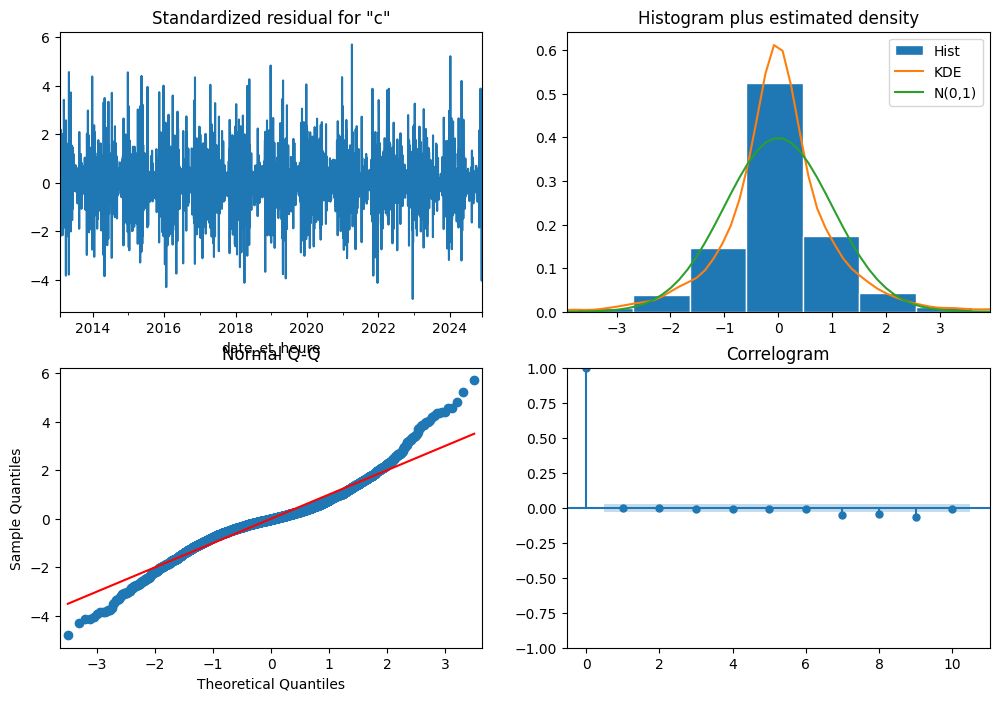

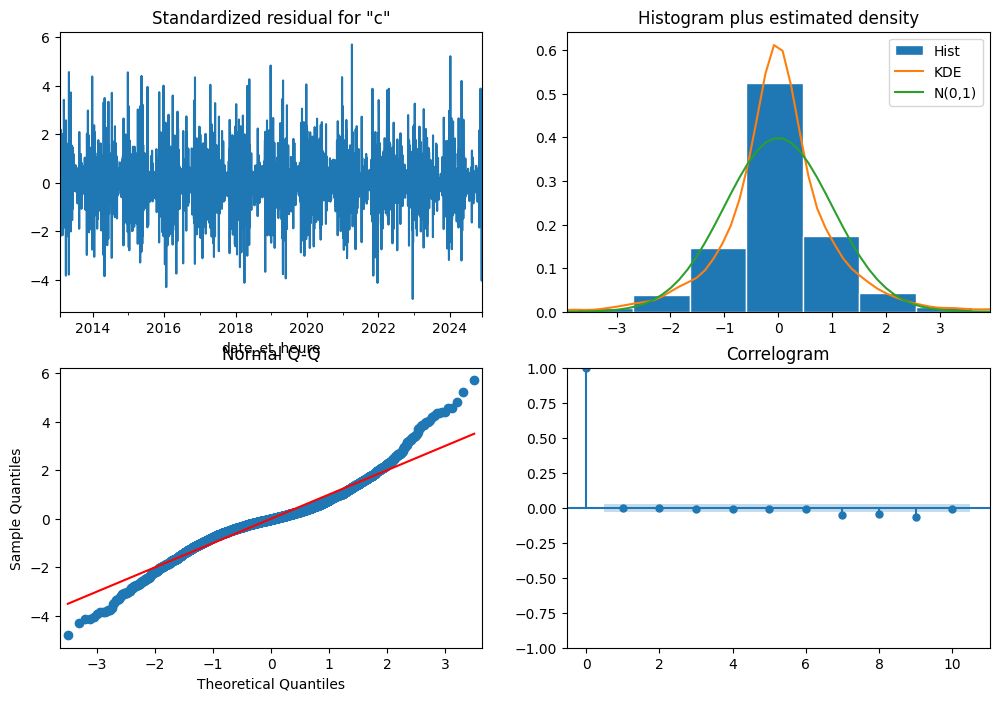

In [19]:
results.plot_diagnostics(figsize=(12, 8))

In [29]:
forecast = results.get_forecast(steps=30)
pred_mean  = forecast.predicted_mean
pred_conf = forecast.conf_int()


### Visualisation

In [40]:
# Align indices
pred_mean.index = test.index
pred_conf.index = test.index

"""fig = go.Figure()

# Train
fig.add_trace(go.Scatter(
    x=train.index,
    y=train,
    name="Train",
    mode="lines"
))

# Test (réalité)
fig.add_trace(go.Scatter(
    x=test.index,
    y=test,
    name="Test (réel)",
    mode="lines"
))

# Prédiction
fig.add_trace(go.Scatter(
    x=test.index,
    y=pred_mean,
    name="Prédiction SARIMA",
    mode="lines"
))

# Intervalle de confiance
fig.add_trace(go.Scatter(
    x=test.index,
    y=pred_conf.iloc[:, 0],
    mode="lines",
    line=dict(width=0),
    showlegend=False
))

fig.add_trace(go.Scatter(
    x=test.index,
    y=pred_conf.iloc[:, 1],
    mode="lines",
    fill='tonexty',
    line=dict(width=0),
    name="Intervalle confiance"
))

fig.update_layout(
    title="Prévision SARIMA vs Réalité (30 derniers jours)",
    xaxis_title="Date",
    yaxis_title="Consommation",
    template="plotly_white"
)

fig.show()"""

'fig = go.Figure()\n\n# Train\nfig.add_trace(go.Scatter(\n    x=train.index,\n    y=train,\n    name="Train",\n    mode="lines"\n))\n\n# Test (réalité)\nfig.add_trace(go.Scatter(\n    x=test.index,\n    y=test,\n    name="Test (réel)",\n    mode="lines"\n))\n\n# Prédiction\nfig.add_trace(go.Scatter(\n    x=test.index,\n    y=pred_mean,\n    name="Prédiction SARIMA",\n    mode="lines"\n))\n\n# Intervalle de confiance\nfig.add_trace(go.Scatter(\n    x=test.index,\n    y=pred_conf.iloc[:, 0],\n    mode="lines",\n    line=dict(width=0),\n    showlegend=False\n))\n\nfig.add_trace(go.Scatter(\n    x=test.index,\n    y=pred_conf.iloc[:, 1],\n    mode="lines",\n    fill=\'tonexty\',\n    line=dict(width=0),\n    name="Intervalle confiance"\n))\n\nfig.update_layout(\n    title="Prévision SARIMA vs Réalité (30 derniers jours)",\n    xaxis_title="Date",\n    yaxis_title="Consommation",\n    template="plotly_white"\n)\n\nfig.show()'

In [41]:
# visualiser les resultats
fig = px.line(title='Forecast vs Actuals - SARIMA')
fig.add_scatter(x=test.index, y=test['consommation_mw'], name='Actuals')
fig.add_scatter(x=test.index, y=pred_mean, name='SARIMA Forecast')
fig.show()

In [42]:
# evaluer les performances du modèle SARIMA evaluate_forecasts
mae_sarima, rmse_sarima, mape_sarima = evaluate_forecasts(test, pred_mean)
print(f'SARIMA MAE: {mae_sarima}, RMSE: {rmse_sarima}, MAPE: {mape_sarima}')


SARIMA MAE: 3639.502997496609, RMSE: 4952.084325509726, MAPE: nan


In [43]:
print(f'Naive Forecast - MAE: {mae_naive_forecast}, RMSE: {rmse_naive_forecast}, MAPE: {mape_naive_forecast}')
print(f'Seasonal Naive Forecast - MAE: {mae_seasonal_naive_forecast}, RMSE: {rmse_seasonal_naive_forecast}, MAPE: {mape_seasonal_naive_forecast}')
print(f'Moving Average Forecast - MAE: {mae_moving_average_forecast}, RMSE: {rmse_moving_average_forecast}, MAPE: {mape_moving_average_forecast}')
print(f'SARIMA MAE: {mae_sarima}, RMSE: {rmse_sarima}, MAPE: {mape_sarima}')


Naive Forecast - MAE: 7467.339855072467, RMSE: 8354.524507130278, MAPE: 11.686264745552887
Seasonal Naive Forecast - MAE: 10954.788285024157, RMSE: 12796.603583613256, MAPE: 17.3154494970608
Moving Average Forecast - MAE: 9290.669392684611, RMSE: 10840.158323767824, MAPE: 14.658560168171078
SARIMA MAE: 3639.502997496609, RMSE: 4952.084325509726, MAPE: nan


Nous voyons qu'on a grandement evolue dans la prediction du coup et nous somme avec sarima d'une marge d'erreur se rapprochant de moins de 5% en tenant en compte les jours feries, ajout température, saison etc... on poura encore ameliorer le score